<a href="https://colab.research.google.com/github/gautamkr1876/AIML_ClassNotes/blob/main/8.%20Agentic%20AI%20Systems/8.%20%20Advanced%20Agent%20Patterns%3A%20ReAct%2C%20Reflection%20%26%20Memory/Classroom_pynb_file_REACT___REFLECTION_and_MEMORY.ipynb" target="_blank">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

#AGENDA : REACT , REFLECTION and MEMORY

#We will start at 9:06 pm


Here is what we are covering today:

**ReAct Pattern**: How agents interleave reasoning with actions to solve complex tasks

**Reflection Pattern**: How agents critique and improve their own outputs

**Memory Systems:** How agents remember, retrieve, and use information across interactions bold text


In [2]:
!pip install -q langgraph langchain-groq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.5/137.5 kB 4.9 MB/s eta 0:00:00


In [3]:
import os
from google.colab import userdata
os.environ["GROQ_API_KEY"]=userdata.get("GROQ_API_KEY")


In [ ]:
import os
from google.colab import userdata
os.environ["GROQ_API_KEY"]=userdata.get("GROQ_API_KEY")

In [4]:
from langchain_groq import ChatGroq
import os

llm = ChatGroq(
    model="openai/gpt-oss-120b",
    temperature=0,
    api_key=os.environ["GROQ_API_KEY"]
)

print(llm.invoke("Say Groq ready").content)

Groq ready


In [5]:
from langchain_groq import ChatGroq
import os
llm=ChatGroq(model="openai/gpt-oss-120b",temperature=0,api_key=os.environ["GROQ_API_KEY"])
print(llm.invoke("Groq reflection ready").content)

Ready and waiting—let me know what you'd like to reflect on!


#ReAct Pattern


| Step | What Happens | Example |
|------|-------------|---------|
| **Thought** | The agent reasons about what it knows and what it needs to do next | "The customer is asking about order 1001. Let me look it up." |
| **Action** | The agent calls a tool or takes an external action | `lookup_order("1001")` |
| **Observation** | The agent receives the result of the action | "Order 1001: Shipped, 2 items, arriving June 15" |

This loop repeats until the agent has enough information to produce a final answer.

                         USER
                          │
                          ▼
                 ┌────────────────┐
                 │      AGENT     │
                 │     DECIDE     │
                 └───────┬────────┘
                         │
                         ▼
                    TAKE ACTION
                         │
                         ▼
                  ┌─────────────┐
                  │  QUESTION / │
                  │    TOOL     │
                  └──────┬──────┘
                         │
                         ▼
                    OBSERVATION
                         │
                         ▼
                 ┌────────────────┐
                 │      AGENT     │
                 │  DECIDE AGAIN  │
                 └───────┬────────┘
                         │
                    ┌────┴─────┐
                    │          │
                  Continue     Done
                    │          │
                    ▼          ▼
                 ACTION      ANSWER
                    │
                    └──────────►


# A Concrete ReAct Trace
Question: "A customer says their order 1005 has not arrived. They want to know what they ordered and whether the items are still available for a replacement."

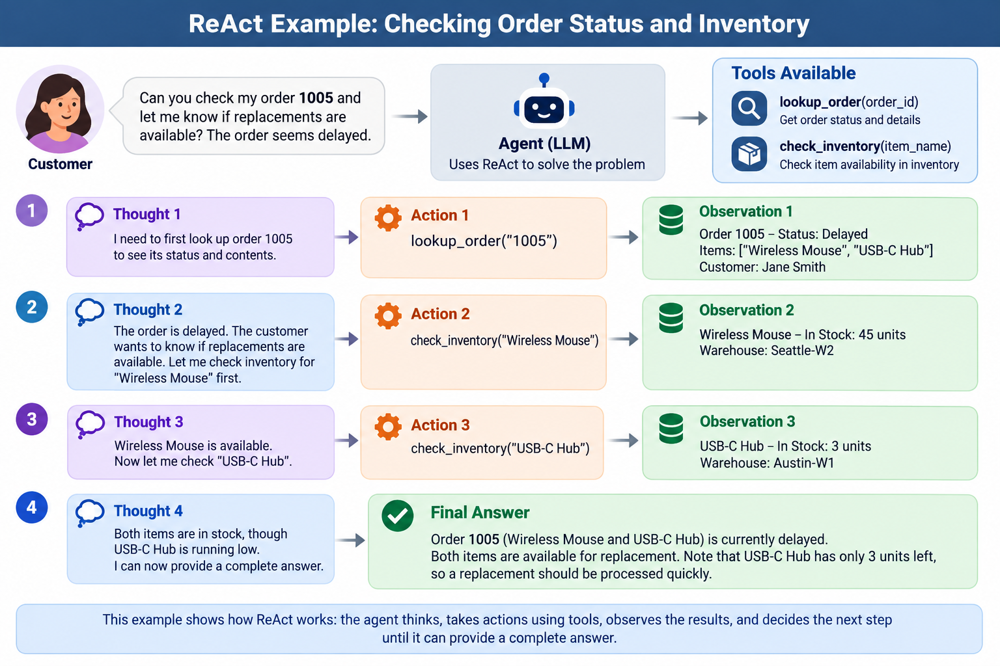



#How ReAct compares with other pattern

| Feature | Chain-of-Thought (CoT) | Plan-and-Solve | ReAct |
|---------|----------------------|----------------|-------|
| **Approach** | Think step by step, then answer | Plan all steps first, then execute sequentially | Interleave thinking and acting |
| **Tool Use** | No | Yes (after planning) | Yes (during reasoning) |
| **Adaptability** | Low. Plan is implicit and fixed | Medium. Plan is explicit but rigid | High. Each step adapts to new observations |
| **Error Recovery** | Poor. Cannot correct mid-reasoning | Moderate. Can re-plan but costly | Strong. Adjusts after every observation |
| **Best For** | Math, logic, simple reasoning | Well-defined multi-step tasks | Open-ended research, dynamic problems |
| **Real-World Analogy** | Solving a math problem on paper | Following a recipe | Debugging a live production system |


# Building a ReAct Agent with Custom Tools

We will build a ReAct agent that acts as an e-commerce support assistant. It has access to three tools that query our (simulated) company systems:

1. **lookup_order**: Gets order details by order ID
2. **get_product_details**: Gets product information by product name
3. **check_inventory**: Checks stock levels for a product

All three tools use hardcoded dictionaries, so there are no external API calls and zero chance of network failures. Let us build the data and tools.

In [6]:
# Our simulated e-commerce database

ORDERS_DB = {
    "1001": {
        "order_id": "1001",
        "customer": "Alice Johnson",
        "items": ["Laptop Pro 15", "Wireless Mouse"],
        "status": "Delivered",
        "order_date": "2024-11-20",
        "delivery_date": "2024-11-25",
        "total": 1349.98
    },
    "1002": {
        "order_id": "1002",
        "customer": "Bob Martinez",
        "items": ["USB-C Hub", "Mechanical Keyboard"],
        "status": "Shipped",
        "order_date": "2024-12-01",
        "estimated_delivery": "2024-12-07",
        "total": 214.98
    },
    "1003": {
        "order_id": "1003",
        "customer": "Carol Lee",
        "items": ["Noise Cancelling Headphones", "Laptop Pro 15", "Phone Stand"],
        "status": "Processing",
        "order_date": "2024-12-05",
        "total": 1479.97
    },
    "1004": {
        "order_id": "1004",
        "customer": "David Kim",
        "items": ["Wireless Mouse", "Phone Stand"],
        "status": "Cancelled",
        "order_date": "2024-11-15",
        "cancellation_reason": "Customer requested cancellation",
        "total": 74.98
    },
    "1005": {
        "order_id": "1005",
        "customer": "Eva Chen",
        "items": ["Mechanical Keyboard", "Monitor 27 inch"],
        "status": "Delayed",
        "order_date": "2024-11-28",
        "delay_reason": "Warehouse backlog",
        "total": 579.98
    }
}

PRODUCTS_DB = {
    "Laptop Pro 15": {
        "name": "Laptop Pro 15",
        "price": 1299.99,
        "category": "Computers",
        "warranty": "24 months",
        "description": "15-inch professional laptop with 16GB RAM and 512GB SSD",
        "rating": 4.7
    },
    "Wireless Mouse": {
        "name": "Wireless Mouse",
        "price": 49.99,
        "category": "Accessories",
        "warranty": "12 months",
        "description": "Ergonomic wireless mouse with 3 DPI settings",
        "rating": 4.3
    },
    "USB-C Hub": {
        "name": "USB-C Hub",
        "price": 89.99,
        "category": "Accessories",
        "warranty": "12 months",
        "description": "7-in-1 USB-C hub with HDMI, USB 3.0, and SD card reader",
        "rating": 4.5
    },
    "Mechanical Keyboard": {
        "name": "Mechanical Keyboard",
        "price": 124.99,
        "category": "Accessories",
        "warranty": "24 months",
        "description": "RGB mechanical keyboard with Cherry MX Blue switches",
        "rating": 4.6
    },
    "Noise Cancelling Headphones": {
        "name": "Noise Cancelling Headphones",
        "price": 129.99,
        "category": "Audio",
        "warranty": "18 months",
        "description": "Over-ear headphones with active noise cancellation and 30hr battery",
        "rating": 4.8
    },
    "Phone Stand": {
        "name": "Phone Stand",
        "price": 24.99,
        "category": "Accessories",
        "warranty": "6 months",
        "description": "Adjustable aluminum phone and tablet stand",
        "rating": 4.2
    },
    "Monitor 27 inch": {
        "name": "Monitor 27 inch",
        "price": 454.99,
        "category": "Displays",
        "warranty": "36 months",
        "description": "27-inch 4K IPS monitor with USB-C input and 99% sRGB",
        "rating": 4.6
    }
}

INVENTORY_DB = {
    "Laptop Pro 15": {"in_stock": 12, "warehouse": "Seattle-W1"},
    "Wireless Mouse": {"in_stock": 145, "warehouse": "Seattle-W2"},
    "USB-C Hub": {"in_stock": 3, "warehouse": "Austin-W1"},
    "Mechanical Keyboard": {"in_stock": 67, "warehouse": "Seattle-W2"},
    "Noise Cancelling Headphones": {"in_stock": 0, "warehouse": "Austin-W1"},
    "Phone Stand": {"in_stock": 230, "warehouse": "Seattle-W1"},
    "Monitor 27 inch": {"in_stock": 8, "warehouse": "Austin-W2"}
}

print(f"Database loaded: {len(ORDERS_DB)} orders, {len(PRODUCTS_DB)} products, {len(INVENTORY_DB)} inventory records")

Database loaded: 5 orders, 7 products, 7 inventory records


Now lets wrap these  db into Langchain compatible tools .

In [7]:
from langchain_core.tools import tool

@tool
def lookup_order(order_id: str) -> str:
    """Look up an order by its order ID. Returns order details including
    customer name, items ordered, order status, dates, and total amount.
    Use this when you need to find information about a specific order."""

    order = ORDERS_DB.get(order_id)
    if not order:
        return f"Error: No order found with ID '{order_id}'. Valid order IDs are: {list(ORDERS_DB.keys())}"

    result = f"Order {order['order_id']}:\n"
    result += f"  Customer: {order['customer']}\n"
    result += f"  Items: {', '.join(order['items'])}\n"
    result += f"  Status: {order['status']}\n"
    result += f"  Order Date: {order['order_date']}\n"
    result += f"  Total: ${order['total']}\n"

    if 'delivery_date' in order:
        result += f"  Delivery Date: {order['delivery_date']}\n"
    if 'estimated_delivery' in order:
        result += f"  Estimated Delivery: {order['estimated_delivery']}\n"
    if 'delay_reason' in order:
        result += f"  Delay Reason: {order['delay_reason']}\n"
    if 'cancellation_reason' in order:
        result += f"  Cancellation Reason: {order['cancellation_reason']}\n"

    return result

@tool
def get_product_details(product_name: str) -> str:
    """Get detailed information about a product by its name. Returns price,
    category, warranty period, description, and customer rating.
    Use this when you need to know product specifications, pricing, or warranty info."""

    product = PRODUCTS_DB.get(product_name)
    if not product:
        available = list(PRODUCTS_DB.keys())
        return f"Error: Product '{product_name}' not found. Available products: {available}"

    result = f"Product: {product['name']}\n"
    result += f"  Price: ${product['price']}\n"
    result += f"  Category: {product['category']}\n"
    result += f"  Warranty: {product['warranty']}\n"
    result += f"  Description: {product['description']}\n"
    result += f"  Rating: {product['rating']}/5.0\n"

    return result

@tool
def check_inventory(product_name: str) -> str:
    """Check the current inventory level for a product. Returns the number
    of units in stock and the warehouse location.
    Use this when you need to know if a product is available or how many units remain."""

    inventory = INVENTORY_DB.get(product_name)
    if not inventory:
        available = list(INVENTORY_DB.keys())
        return f"Error: Product '{product_name}' not found in inventory. Available products: {available}"

    status = "In Stock" if inventory["in_stock"] > 0 else "Out of Stock"
    low_stock_warning = " (LOW STOCK)" if 0 < inventory["in_stock"] <= 5 else ""

    result = f"Inventory for {product_name}:\n"
    result += f"  Status: {status}{low_stock_warning}\n"
    result += f"  Units Available: {inventory['in_stock']}\n"
    result += f"  Warehouse: {inventory['warehouse']}\n"

    return result

# Quick test to make sure all tools work
print("Testing lookup_order:")
print(lookup_order.invoke({"order_id": "1001"}))
print("\nTesting get_product_details:")
print(get_product_details.invoke({"product_name": "Wireless Mouse"}))
print("\nTesting check_inventory:")
print(check_inventory.invoke({"product_name": "Noise Cancelling Headphones"}))

Testing lookup_order:
Order 1001:
  Customer: Alice Johnson
  Items: Laptop Pro 15, Wireless Mouse
  Status: Delivered
  Order Date: 2024-11-20
  Total: $1349.98
  Delivery Date: 2024-11-25


Testing get_product_details:
Product: Wireless Mouse
  Price: $49.99
  Category: Accessories
  Warranty: 12 months
  Description: Ergonomic wireless mouse with 3 DPI settings
  Rating: 4.3/5.0


Testing check_inventory:
Inventory for Noise Cancelling Headphones:
  Status: Out of Stock
  Units Available: 0
  Warehouse: Austin-W1



In [8]:
from langchain_groq import ChatGroq
from langgraph.prebuilt import create_react_agent
import os
llm=ChatGroq(model="openai/gpt-oss-120b",temperature=0,api_key=os.environ["GROQ_API_KEY"])
tools=[lookup_order,get_product_details,check_inventory]
agent=create_react_agent(model=llm,tools=tools,prompt="You are a helpful e-commerce customer support agent.")
print("ReAct agent created.")
#create_react_agent: prebuild function of langgraph that created ReAct style agent

ReAct agent created.


/tmp/ipykernel_3724/845859935.py:6: LangGraphDeprecatedSinceV10: create_react_agent has been moved to `langchain.agents`. Please update your import to `from langchain.agents import create_agent`. Deprecated in LangGraph V1.0 to be removed in V2.0.
  agent=create_react_agent(model=llm,tools=tools,prompt="You are a helpful e-commerce customer support agent.")


#lets create a helper function that runs the agent and prints each step clearly so we can see the full react trace

In [9]:
def run_agent(query: str):
    """Run the ReAct agent and display the full trace of steps."""

    print("=" * 70)
    print(f"QUERY: {query}")
    print("=" * 70)

    step_count = 0 #how many agents messages are displayed
    tool_call_count = 0

    for step in agent.stream(
        {"messages": [{"role": "user", "content": query}]},
        stream_mode="updates"
    ):
        for node_name, node_output in step.items():
            messages = node_output.get("messages", [])
            for msg in messages:
                msg_type = msg.__class__.__name__

                if msg_type == "AIMessage":
                    # The agent's reasoning or final answer
                    if msg.content:
                        step_count += 1
                        print(f"\n[Step {step_count} - Agent Reasoning]")
                        print(msg.content)

                    # Check for tool calls
                    if hasattr(msg, "tool_calls") and msg.tool_calls:
                        for tc in msg.tool_calls:
                            tool_call_count += 1
                            print(f"\n[Step {step_count} - Tool Call #{tool_call_count}]")
                            print(f"  Tool: {tc['name']}")
                            print(f"  Input: {tc['args']}")

                elif msg_type == "ToolMessage":
                    print(f"\n[Observation from {msg.name}]")
                    print(f"  {msg.content}")

    print(f"\n{'=' * 70}")
    print(f"Trace complete. Tool calls made: {tool_call_count}")
    print("=" * 70)

### Query 1: Simple Single-Tool Lookup

In [10]:
run_agent("What is the status of order 1002? Who placed it and when will it arrive?")

QUERY: What is the status of order 1002? Who placed it and when will it arrive?

[Step 0 - Tool Call #1]
  Tool: lookup_order
  Input: {'order_id': '1002'}

[Observation from lookup_order]
  Order 1002:
  Customer: Bob Martinez
  Items: USB-C Hub, Mechanical Keyboard
  Status: Shipped
  Order Date: 2024-12-01
  Total: $214.98
  Estimated Delivery: 2024-12-07


[Step 1 - Agent Reasoning]
Here’s the information for **order 1002**:

- **Customer:** Bob Martinez  
- **Current status:** **Shipped**  
- **Estimated delivery date:** **December 7, 2024**  

If you need any further assistance—such as tracking details, updating the delivery address, or anything else—just let me know!

Trace complete. Tool calls made: 1


### Query 2: Multi-Tool Reasoning

In [11]:
run_agent(
    "I placed order 1002. Can you tell me the price and warranty "
    "information for each item in my order?"
)

QUERY: I placed order 1002. Can you tell me the price and warranty information for each item in my order?

[Step 0 - Tool Call #1]
  Tool: lookup_order
  Input: {'order_id': '1002'}

[Observation from lookup_order]
  Order 1002:
  Customer: Bob Martinez
  Items: USB-C Hub, Mechanical Keyboard
  Status: Shipped
  Order Date: 2024-12-01
  Total: $214.98
  Estimated Delivery: 2024-12-07


[Step 0 - Tool Call #2]
  Tool: get_product_details
  Input: {'product_name': 'USB-C Hub'}

[Observation from get_product_details]
  Product: USB-C Hub
  Price: $89.99
  Category: Accessories
  Warranty: 12 months
  Description: 7-in-1 USB-C hub with HDMI, USB 3.0, and SD card reader
  Rating: 4.5/5.0


[Step 0 - Tool Call #3]
  Tool: get_product_details
  Input: {'product_name': 'Mechanical Keyboard'}

[Observation from get_product_details]
  Product: Mechanical Keyboard
  Price: $124.99
  Category: Accessories
  Warranty: 24 months
  Description: RGB mechanical keyboard with Cherry MX Blue switches
  R

### Query 3: Complex Multi-Step Reasoning

In [12]:
run_agent(
    "I have order 1003. Can you check which of my items are currently "
    "in stock and which ones might be hard to replace if something goes wrong? "
    "Also, what is the total warranty coverage I have?"
)

QUERY: I have order 1003. Can you check which of my items are currently in stock and which ones might be hard to replace if something goes wrong? Also, what is the total warranty coverage I have?

[Step 0 - Tool Call #1]
  Tool: lookup_order
  Input: {'order_id': '1003'}

[Observation from lookup_order]
  Order 1003:
  Customer: Carol Lee
  Items: Noise Cancelling Headphones, Laptop Pro 15, Phone Stand
  Status: Processing
  Order Date: 2024-12-05
  Total: $1479.97


[Step 0 - Tool Call #2]
  Tool: get_product_details
  Input: {'product_name': 'Noise Cancelling Headphones'}

[Observation from get_product_details]
  Product: Noise Cancelling Headphones
  Price: $129.99
  Category: Audio
  Warranty: 18 months
  Description: Over-ear headphones with active noise cancellation and 30hr battery
  Rating: 4.8/5.0


[Step 0 - Tool Call #3]
  Tool: check_inventory
  Input: {'product_name': 'Laptop Pro 15'}

[Observation from check_inventory]
  Inventory for Laptop Pro 15:
  Status: In Stock
  U

### Query 4: Handling Edge Cases

In [13]:
run_agent(
    "I want to reorder everything from order 1004. Is that possible? "
    "Check if all items are available."
)

QUERY: I want to reorder everything from order 1004. Is that possible? Check if all items are available.

[Step 0 - Tool Call #1]
  Tool: lookup_order
  Input: {'order_id': '1004'}

[Observation from lookup_order]
  Order 1004:
  Customer: David Kim
  Items: Wireless Mouse, Phone Stand
  Status: Cancelled
  Order Date: 2024-11-15
  Total: $74.98
  Cancellation Reason: Customer requested cancellation


[Step 0 - Tool Call #2]
  Tool: check_inventory
  Input: {'product_name': 'Wireless Mouse'}

[Observation from check_inventory]
  Inventory for Wireless Mouse:
  Status: In Stock
  Units Available: 145
  Warehouse: Seattle-W2


[Step 0 - Tool Call #3]
  Tool: check_inventory
  Input: {'product_name': 'Phone Stand'}

[Observation from check_inventory]
  Inventory for Phone Stand:
  Status: In Stock
  Units Available: 230
  Warehouse: Seattle-W1


[Step 1 - Agent Reasoning]
Great news! Both items from your previous order #1004 are currently in stock:

| Item | Units Available | Warehouse |


#Reflection: Concept Deep Dive:
Reflection is a pattern where an agent evaluates its own output, identifies weaknesses, and generates an improved version. Think of it as a built-in quality assurance loop.

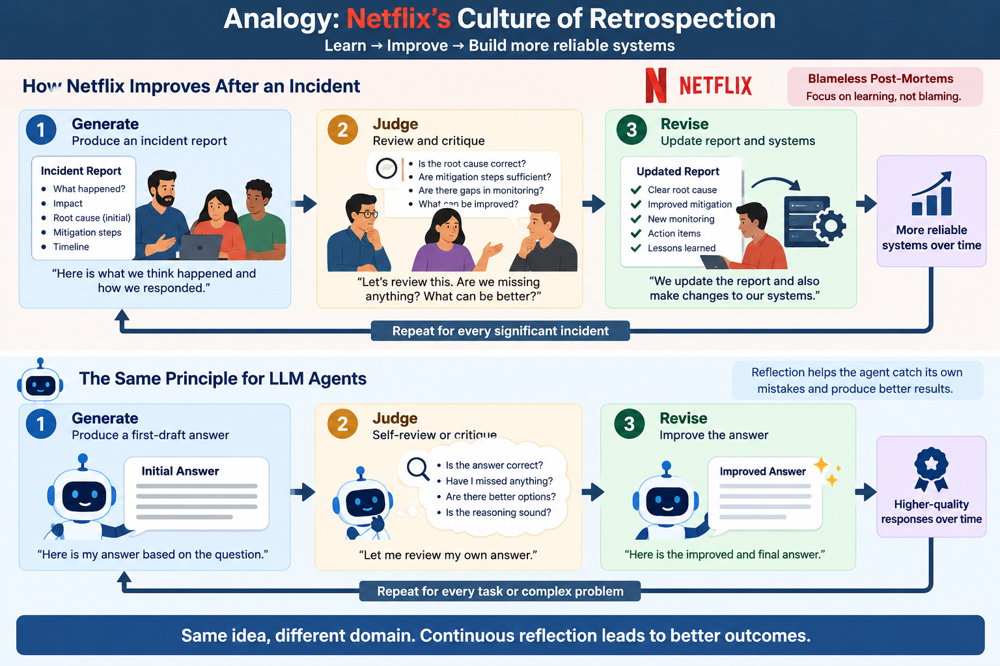


There are two common architectures for reflection:

**Architecture 1: Single LLM, Two Roles**

The same LLM plays both the generator and the judge, but with different system prompts.

```
[System: You are a code generator]  --->  Generates code
[System: You are a code reviewer]   --->  Critiques the code
[System: You are a code generator]  --->  Revises based on critique
```

This is simpler but the model might be blind to its own systematic errors.

**Architecture 2: Two Different LLMs**

A separate, possibly stronger model acts as the judge.

```
Model A (Generator)  --->  Generates code
Model B (Judge)      --->  Critiques the code
Model A (Generator)  --->  Revises based on Model B's critique
```

This is more robust because the judge has a different "perspective." In practice at companies like Google or Microsoft, you often see a stronger model (like GPT-4 or Gemini Pro) judging outputs from a faster, cheaper model.

Today we will implement Architecture 1 using the raw Gemini SDK, with the same model playing both roles through different system instructions.

### When Reflection Helps vs. When It Does Not
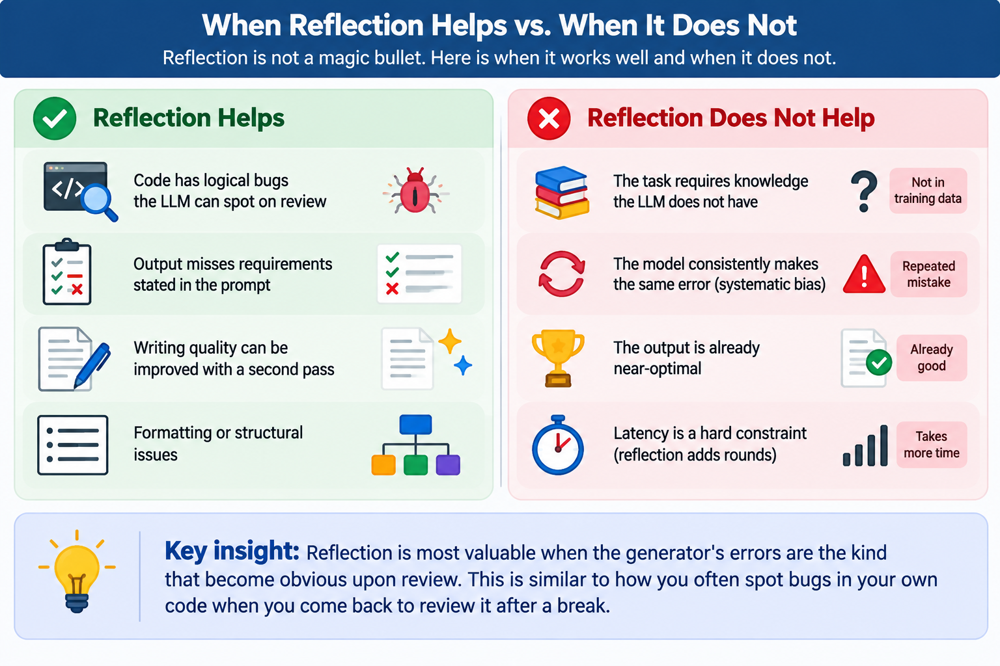

# Building a Judge-Revise Loop for Code Generation

We will build a system where:
1. A **Generator** writes a Python function based on a specification
2. A **Judge** reviews the code for correctness, edge cases, and style
3. The **Generator** revises the code based on the judge's feedback
4. We can run this loop multiple times to see iterative improvement

We are using the raw Gemini SDK here. No LangChain, no chains, no abstractions. Just direct function calls to the model with different system instructions. This makes the reflection pattern completely transparent.

In [14]:
from langchain_groq import ChatGroq
from langchain_core.messages import SystemMessage,HumanMessage
import os
llm=ChatGroq(model="openai/gpt-oss-120b",temperature=0,api_key=os.environ["GROQ_API_KEY"])
def _ask(sys,u): return llm.invoke([SystemMessage(content=sys),HumanMessage(content=u)]).content

def generate_code(spec): return _ask("You are an expert Python developer. Return only Python code.",spec)
def judge_code(code): return _ask("You are a senior reviewer. Reply LGTM if perfect.",code)
def revise_code(spec,previous_code,feedback): return _ask("You are an expert Python developer.",f"Specification:\n{spec}\n\nPrevious Code:\n{previous_code}\n\nFeedback:\n{feedback}")

In [15]:
def reflect_and_revise(spec: str, max_iterations: int = 3, verbose: bool = True) -> dict:
    """
    Run the Judge-Revise reflection loop.

    Args:
        spec: The code specification/requirements
        max_iterations: Maximum number of revision cycles
        verbose: Whether to print each step

    Returns:
        Dictionary with the history of generations, critiques, and the final code
    """
    history = {"iterations": []}

    # Step 1: Initial Generation
    if verbose:
        print("=" * 70)
        print("INITIAL GENERATION")
        print("=" * 70)

    current_code = generate_code(spec)

    if verbose:
        print(current_code)

    for i in range(max_iterations):
        if verbose:
            print(f"\n{'=' * 70}")
            print(f"JUDGE REVIEW - ITERATION {i + 1}")
            print(f"{'=' * 70}")

        # Step 2: Judge reviews the code
        critique = judge_code(current_code)

        if verbose:
            print(f"\nFEEDBACK:\n{critique}")

        iteration_record = {
            "iteration": i + 1,
            "code": current_code,
            "critique": critique
        }
        history["iterations"].append(iteration_record)

        # Check if the judge approves
        if "LGTM" in critique.strip().upper():
            if verbose:
                print(f"\nJudge approved the code at iteration {i + 1}!")
            history["final_code"] = current_code
            history["total_iterations"] = i + 1
            history["approved"] = True
            return history

        # Step 3: Revise based on feedback
        if verbose:
            print(f"\n{'=' * 70}")
            print(f"REVISION - ITERATION {i + 1}")
            print(f"{'=' * 70}")

        revised_code = revise_code(spec, current_code, critique)

        if verbose:
            print(f"\nREVISED CODE:\n{revised_code}")

        current_code = revised_code

    history["final_code"] = current_code
    history["total_iterations"] = max_iterations
    history["approved"] = False
    return history

print("Reflection loop is ready.")

Reflection loop is ready.


In [16]:
spec_1 = """
Write a Python function called 'merge_sorted_lists' that takes two sorted lists
of integers and returns a single sorted list containing all elements from both lists.

Requirements:
- Handle empty lists
- Handle lists of different lengths
- Handle duplicate values
- Do NOT use Python's built-in sort() or sorted()
- Time complexity should be O(n + m) where n and m are the lengths of the input lists
"""

result_1 = reflect_and_revise(spec_1, max_iterations=3)

INITIAL GENERATION
```python
def merge_sorted_lists(a, b):
    """
    Merge two sorted lists of integers into a single sorted list.

    Parameters
    ----------
    a : list[int]
        First sorted list (may be empty).
    b : list[int]
        Second sorted list (may be empty).

    Returns
    -------
    list[int]
        A new list containing all elements from `a` and `b` in sorted order.
    """
    i, j = 0, 0
    merged = []

    # Iterate while both lists have unprocessed elements
    while i < len(a) and j < len(b):
        if a[i] <= b[j]:
            merged.append(a[i])
            i += 1
        else:
            merged.append(b[j])
            j += 1

    # Append any remaining elements from the list that is not exhausted
    if i < len(a):
        merged.extend(a[i:])
    if j < len(b):
        merged.extend(b[j:])

    return merged
```

JUDGE REVIEW - ITERATION 1

FEEDBACK:
LGTM.

Judge approved the code at iteration 1!


#lets verify if final code works or not

In [17]:
import re

# Extract only the Python code from the final_code string
code_match = re.search(r"```python\n(.*?)```", result_1["final_code"], re.DOTALL)
if code_match:
    executable_code = code_match.group(1)
else:
    executable_code = result_1["final_code"] # Fallback if regex fails, though it might still error

# Execute the final generated code
exec(executable_code)

# Run test cases
print("Test 1 - Normal case:")
print(f"  merge_sorted_lists([1, 3, 5], [2, 4, 6]) = {merge_sorted_lists([1, 3, 5], [2, 4, 6])}")

print("\nTest 2 - Empty lists:")
print(f"  merge_sorted_lists([], [1, 2, 3]) = {merge_sorted_lists([], [1, 2, 3])}")
print(f"  merge_sorted_lists([1, 2], []) = {merge_sorted_lists([1, 2], [])}")
print(f"  merge_sorted_lists([], []) = {merge_sorted_lists([], [])}")

print("\nTest 3 - Duplicates:")
print(f"  merge_sorted_lists([1, 2, 2], [2, 3, 3]) = {merge_sorted_lists([1, 2, 2], [2, 3, 3])}")

print("\nTest 4 - Different lengths:")
print(f"  merge_sorted_lists([1], [2, 3, 4, 5]) = {merge_sorted_lists([1], [2, 3, 4, 5])}")

Test 1 - Normal case:
  merge_sorted_lists([1, 3, 5], [2, 4, 6]) = [1, 2, 3, 4, 5, 6]

Test 2 - Empty lists:
  merge_sorted_lists([], [1, 2, 3]) = [1, 2, 3]
  merge_sorted_lists([1, 2], []) = [1, 2]
  merge_sorted_lists([], []) = []

Test 3 - Duplicates:
  merge_sorted_lists([1, 2, 2], [2, 3, 3]) = [1, 2, 2, 2, 3, 3]

Test 4 - Different lengths:
  merge_sorted_lists([1], [2, 3, 4, 5]) = [1, 2, 3, 4, 5]


#MEMORY SYSTEM FOR AGENTS

Three types of Memory : Short term , Episodic Term, Long Term


| Memory Type | What It Stores | Duration | Analogy |
|------------|---------------|----------|---------|
| **Short-term Memory** | Current conversation context | Single session | Your working memory while solving a problem |
| **Episodic Memory** | Conversation history across sessions | Medium-term | Your memory of past conversations with a colleague |
| **Long-term Memory** | Accumulated knowledge in a vector store | Persistent | A company's knowledge base or documentation |

### Memory Retrieval and Relevance Scoring

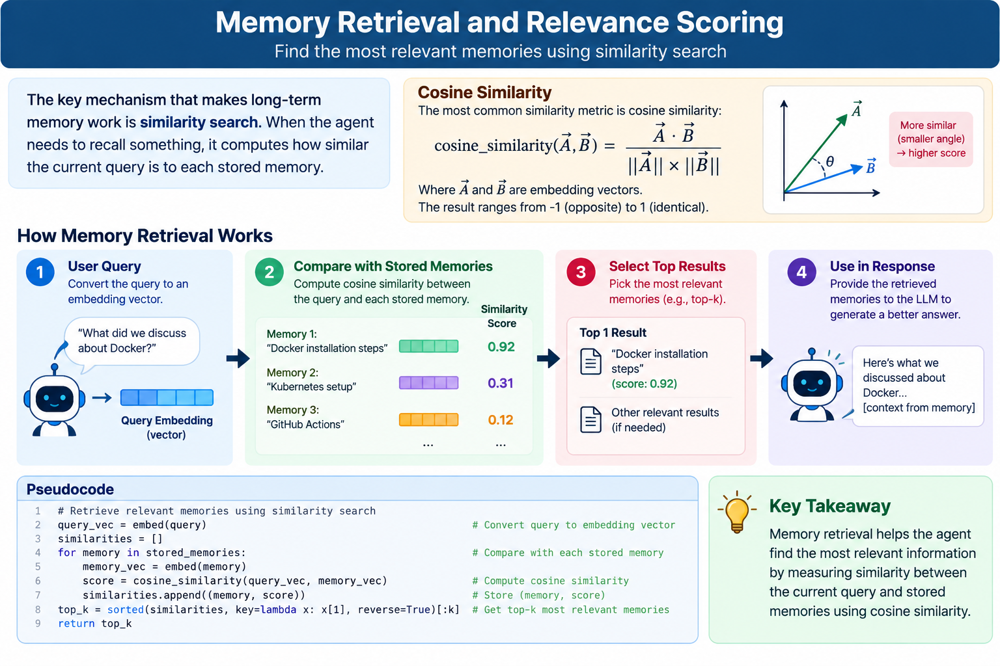

In [ ]:
# PSEUDOCODE: Memory Retrieval System
# This is illustrative and not meant to be executed

class AgentMemory:
    """
    Manages long-term memory for an agent using a vector store.
    """
    def __init__(self, embedding_model, vector_store):
        self.embedding_model = embedding_model  # e.g., Google text-embedding-004
        self.vector_store = vector_store        # e.g., ChromaDB, FAISS, Pinecone

    def store_memory(self, text: str, metadata: dict = None):
        """Store a piece of information in long-term memory."""
        # Convert text to embedding vector (e.g., 768-dimensional float array)
        embedding = self.embedding_model.embed(text)

        # Store in vector database with metadata for filtering
        self.vector_store.add(
            embedding=embedding,
            text=text,
            metadata=metadata  # e.g., {"timestamp": "2024-01-15", "source": "user"}
        )

    def retrieve_relevant_memories(self, query: str, top_k: int = 3) -> list:
        """Retrieve the most relevant memories for a given query."""
        # Convert query to embedding
        query_embedding = self.embedding_model.embed(query)

        # Search vector store using cosine similarity
        results = self.vector_store.similarity_search(
            query_embedding=query_embedding,
            top_k=top_k
        )

        relevant = [text for text, score in results if score > 0.5]
        return relevant

print("Pseudocode: Memory retrieval system architecture")

# ### How These Memory Types Work Together
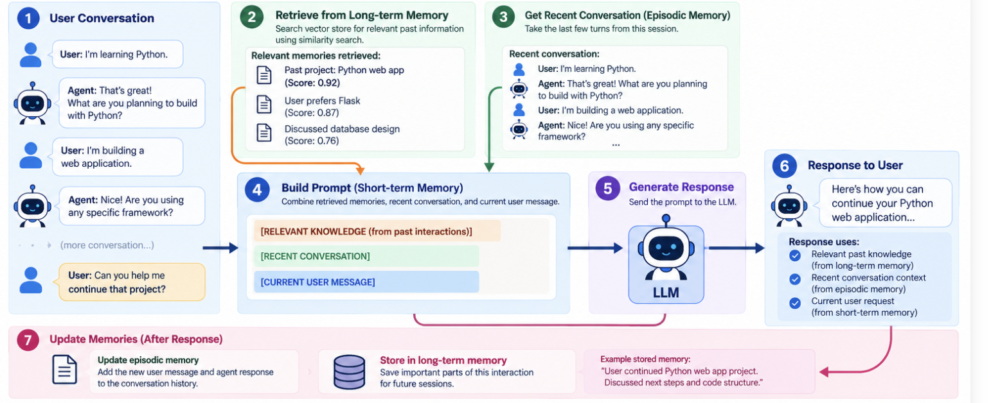

In [ ]:
# PSEUDOCODE: Complete Memory-Augmented Agent
# This is illustrative and not meant to be executed

class MemoryAugmentedAgent:
    """
    An agent that uses all three memory types:
    short-term (context window), episodic (conversation history),
    and long-term (vector store).
    """
    def __init__(self, llm, memory: "AgentMemory"):
        self.llm = llm
        self.memory = memory
        self.conversation_history = []  # Episodic memory (in-session)

    def respond(self, user_message: str) -> str:
        # 1. LONG-TERM MEMORY: Retrieve relevant past knowledge
        relevant_memories = self.memory.retrieve_relevant_memories(
            query=user_message,
            top_k=3
        )

        # 2. EPISODIC MEMORY: Include recent conversation turns
        recent_history = self.conversation_history[-10:]

        # 3. SHORT-TERM MEMORY: Everything assembled into the prompt
        #    below constitutes the agent's working memory
        prompt = (
            "You are a helpful assistant with access to the following context:\n\n"
            "RELEVANT KNOWLEDGE (from past interactions):\n"
            f"{relevant_memories}\n\n"
            "RECENT CONVERSATION:\n"
            f"{recent_history}\n\n"
            "USER MESSAGE:\n"
            f"{user_message}\n\n"
            "Respond helpfully, using the provided context when relevant."
        )

        # Generate response
        response = self.llm.generate(prompt)

        # Update episodic memory for this session
        self.conversation_history.append(f"User: {user_message}")
        self.conversation_history.append(f"Agent: {response}")

        # Persist to long-term memory for future sessions
        self.memory.store_memory(
            text=f"User asked: {user_message}. Agent responded: {response}",
            metadata={"type": "conversation", "timestamp": "2024-07-01"}
        )

        return response

print("Pseudocode: Memory-augmented agent architecture")